In [1]:
import pandas as pd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import string

import nltk
from nltk.corpus import stopwords

In [2]:
df = pd.read_pickle('/work/NLP_Project/word2vec_tokenized.pkl')

In [4]:
df

,title,tag,artist,year,lyrics,id,lyrics_word_count,tokenized_lyrics
0,Killa Cam,rap,Cam'ron,2004,killa cam killa cam cam killa cam killa cam k...,1,762,"[killa, cam, killa, cam, cam, killa, cam, kill..."
1,Can I Live,rap,JAY-Z,1996,yeah hah yeah rocafella we invite you to so...,3,548,"[yeah, hah, yeah, rocafella, we, invite, you, ..."
2,Forgive Me Father,rap,Fabolous,2003,maybe cause im eatin and these bastards fiend ...,4,574,"[maybe, cause, im, eatin, and, these, bastards..."
3,Down and Out,rap,Cam'ron,2004,ugh killa baby kanye this that 1970s heron ...,5,760,"[ugh, killa, baby, kanye, this, that, 1970s, h..."
4,Fly In,rap,Lil Wayne,2005,so they ask me young boy what you gon do the ...,6,432,"[so, they, ask, me, young, boy, what, you, gon..."
...,...,...,...,...,...,...,...,...
5913399,Everything Is Alright Now,pop,Chuck Bernard,2013,everything is alright now oh yes baby everythi...,7882838,63,"[everything, is, alright, now, oh, yes, baby, ..."
5913401,White Lies,pop,ElementD,2019,half truth and half you didnt we say were thr...,7882840,171,"[half, truth, and, half, you, didnt, we, say, ..."
5913403,Ocean,pop,Effemar,2022,dance for me now keeping yourself moving your...,7882842,166,"[dance, for, me, now, keeping, yourself, movin..."
5913406,Raise Our Hands,pop,"Culture Code, Pag & Mylo",2016,here our purpose feels alive we are more than...,7882845,184,"[here, our, purpose, feels, alive, we, are, mo..."


In [5]:
from gensim.models import Phrases
from gensim.models import Word2Vec
from sklearn.model_selection import train_test_split
# Let's assume you want a subset of 10000 samples
subset_size = 100000

# Use stratified sampling
_, df_subset = train_test_split(df, stratify=df['tag'], test_size=subset_size/len(df), random_state=42)

# Now you can continue with the word2vec training
sentences = df_subset['tokenized_lyrics'].tolist()

# Create bigram and trigram transformers
bigram_transformer = Phrases(sentences, min_count=2, threshold=2)
#trigram_transformer = Phrases(bigram_transformer[sentences], min_count=10)

# Apply the transformers to get sentences with bigrams and trigrams
sentences_with_bigrams = [bigram_transformer[sent] for sent in sentences]
#sentences_with_trigrams = [trigram_transformer[bigram_transformer[sent]] for sent in sentences]

# Train Word2Vec model on sentences with trigrams
#model = Word2Vec(sentences_with_trigrams, size=100, window=5, min_count=10, workers=4)

In [6]:
sentences_with_bigrams

[['nothing',
  'nothing',
  'nothing',
  'woah',
  'you',
  'can',
  '’_t',
  'tell_me',
  'nothing',
  'nothing',
  'nothing',
  'woah',
  'i',
  '’_m',
  'fuckin',
  'on',
  'these',
  'ho',
  'hoes',
  'drugs_heal',
  'these_drugs',
  'heal',
  'my',
  'pain',
  'yeah',
  'aye',
  'prince',
  'drugs_heal',
  'the',
  'pain',
  'these_drugs',
  'heal',
  'my',
  'pain',
  'yeah',
  'i',
  'ain_’',
  't',
  'been',
  'the_same',
  'dope',
  'piece',
  'to',
  'the',
  'face',
  'yeah',
  'drugs_heal',
  'the',
  'pain',
  'these_drugs',
  'heal',
  'my',
  'pain',
  'yeah',
  'i',
  'ain_’',
  't_even',
  'changed',
  'so',
  'call_me',
  'by',
  'name',
  'yeah',
  'drugs_heal',
  'the',
  'pain',
  'these_drugs',
  'heal',
  'my',
  'pain',
  'yeah',
  'perkies',
  'and',
  'the',
  'drank',
  'and',
  'they',
  'here',
  'to',
  'stay',
  'yuh',
  'i',
  'ain_’',
  't',
  'been',
  'the_same',
  'i',
  'ain_’',
  't',
  'been',
  'the_same',
  'no',
  'i',
  '’_m',
  'gon',
  'leav

In [7]:
bigram_model = Word2Vec(sentences_with_bigrams, window=5, min_count=5, workers=31)

In [8]:
#model.wv.most_similar(positive=['woman', 'king'], negative=['man'])
bigram_model.wv.most_similar('drugs_heal')

[('and_pesticides', 0.8201566338539124),
 ('hip_ayy', 0.7894011735916138),
 ('able_may', 0.7862507104873657),
 ('ayyayy_yeah', 0.7851500511169434),
 ('gang_skr', 0.7846819162368774),
 ('ayy_fashion', 0.7844923734664917),
 ('runner_run', 0.7836703658103943),
 ('like_moai', 0.7832256555557251),
 ('ty_dolla', 0.77926105260849),
 ('my_mucus', 0.7789052128791809)]

In [3]:
from gensim.models import Phrases
from gensim.models import Word2Vec
from sklearn.model_selection import train_test_split


# Transform your 'tokenized_lyrics' into a list of sentences where each sentence is a list of words
sentences = df['tokenized_lyrics'].tolist()

# Build the bigram and trigram models
bigram_transformer = Phrases(sentences, min_count=2, threshold=2)
#trigram_transformer = Phrases(bigram_transformer[sentences], min_count=2, threshold=2)

# Transform your sentences into bigrams/trigrams
sentences_with_bigrams = [bigram_transformer[sentence] for sentence in sentences]
#sentences_with_trigrams = [trigram_transformer[bigram_sentence] for bigram_sentence in sentences_with_bigrams]




In [ ]:
sentences_with_bigrams

[['nothing_nothing',
  'nothing',
  'woah',
  'you',
  'can_’_t',
  'tell_me',
  'nothing_nothing',
  'nothing',
  'woah',
  'i_’_m',
  'fuckin',
  'on',
  'these',
  'ho',
  'hoes',
  'drugs_heal',
  'these_drugs_heal',
  'my',
  'pain',
  'yeah_aye',
  'prince',
  'drugs_heal_the',
  'pain_these_drugs',
  'heal',
  'my',
  'pain',
  'yeah',
  'i',
  'ain_’_t',
  'been_the_same',
  'dope',
  'piece',
  'to',
  'the',
  'face',
  'yeah_drugs_heal',
  'the_pain',
  'these_drugs_heal',
  'my',
  'pain',
  'yeah',
  'i',
  'ain_’_t_even',
  'changed',
  'so',
  'call_me',
  'by_name',
  'yeah_drugs_heal',
  'the_pain',
  'these_drugs_heal',
  'my',
  'pain',
  'yeah',
  'perkies',
  'and',
  'the',
  'drank',
  'and',
  'they',
  'here',
  'to',
  'stay',
  'yuh',
  'i',
  'ain_’_t',
  'been_the_same',
  'i',
  'ain_’_t',
  'been_the_same',
  'no',
  'i_’_m',
  'gon_leave',
  'a_stain',
  'i_’_m',
  'gon_leave',
  'a_stain',
  'here',
  'she',
  'keep',
  'trynna_fuck',
  'nah',
  'baby',

In [4]:
# Train Word2Vec model on sentences with trigrams
w2v_model_bigrams = Word2Vec(sentences_with_bigrams, window=5, min_count=5, workers=15)

In [5]:
w2v_model_bigrams.save("bigram_w2v.model")

In [3]:
from gensim.models import Word2Vec
w2v_model_bigrams = Word2Vec.load("bigram_w2v.model")

In [4]:
# Generate word vectors for each song by averaging word vectors of all words in the song
df['word2vec_lyrics'] = df['tokenized_lyrics'].apply(lambda x: np.mean([w2v_model_bigrams.wv[word] for word in x if word in w2v_model_bigrams.wv.key_to_index], axis=0))


/home/ucloud/.local/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [7]:
import gc
gc.collect()

0

In [8]:
df

,title,tag,artist,year,lyrics,id,lyrics_word_count,tokenized_lyrics,word2vec_lyrics
0,Killa Cam,rap,Cam'ron,2004,killa cam killa cam cam killa cam killa cam k...,1,762,"[killa, cam, killa, cam, cam, killa, cam, kill...","[1.2043846, 2.029474, 0.43349192, 0.34483737, ..."
1,Can I Live,rap,JAY-Z,1996,yeah hah yeah rocafella we invite you to so...,3,548,"[yeah, hah, yeah, rocafella, we, invite, you, ...","[1.200486, 1.9756075, 1.176321, -0.13975453, 1..."
2,Forgive Me Father,rap,Fabolous,2003,maybe cause im eatin and these bastards fiend ...,4,574,"[maybe, cause, im, eatin, and, these, bastards...","[1.8427674, 1.8235524, 0.82537705, 0.2974234, ..."
3,Down and Out,rap,Cam'ron,2004,ugh killa baby kanye this that 1970s heron ...,5,760,"[ugh, killa, baby, kanye, this, that, 1970s, h...","[1.5618514, 2.2316048, 1.0447288, -0.006543262..."
4,Fly In,rap,Lil Wayne,2005,so they ask me young boy what you gon do the ...,6,432,"[so, they, ask, me, young, boy, what, you, gon...","[1.7865903, 2.1848695, 1.1303248, -0.053374905..."
...,...,...,...,...,...,...,...,...,...
5913399,Everything Is Alright Now,pop,Chuck Bernard,2013,everything is alright now oh yes baby everythi...,7882838,63,"[everything, is, alright, now, oh, yes, baby, ...","[1.637444, 2.4819617, 2.1091676, -0.13516752, ..."
5913401,White Lies,pop,ElementD,2019,half truth and half you didnt we say were thr...,7882840,171,"[half, truth, and, half, you, didnt, we, say, ...","[1.9420254, 1.7178235, 1.8024782, -0.022329945..."
5913403,Ocean,pop,Effemar,2022,dance for me now keeping yourself moving your...,7882842,166,"[dance, for, me, now, keeping, yourself, movin...","[1.2642314, 0.91296387, 1.597637, -0.16478798,..."
5913406,Raise Our Hands,pop,"Culture Code, Pag & Mylo",2016,here our purpose feels alive we are more than...,7882845,184,"[here, our, purpose, feels, alive, we, are, mo...","[0.76722175, 1.8480681, 0.5693334, 0.17037453,..."


In [9]:
df = df.drop(['id', 'lyrics'], axis=1)

In [10]:
df

,title,tag,artist,year,lyrics_word_count,tokenized_lyrics,word2vec_lyrics
0,Killa Cam,rap,Cam'ron,2004,762,"[killa, cam, killa, cam, cam, killa, cam, kill...","[1.2043846, 2.029474, 0.43349192, 0.34483737, ..."
1,Can I Live,rap,JAY-Z,1996,548,"[yeah, hah, yeah, rocafella, we, invite, you, ...","[1.200486, 1.9756075, 1.176321, -0.13975453, 1..."
2,Forgive Me Father,rap,Fabolous,2003,574,"[maybe, cause, im, eatin, and, these, bastards...","[1.8427674, 1.8235524, 0.82537705, 0.2974234, ..."
3,Down and Out,rap,Cam'ron,2004,760,"[ugh, killa, baby, kanye, this, that, 1970s, h...","[1.5618514, 2.2316048, 1.0447288, -0.006543262..."
4,Fly In,rap,Lil Wayne,2005,432,"[so, they, ask, me, young, boy, what, you, gon...","[1.7865903, 2.1848695, 1.1303248, -0.053374905..."
...,...,...,...,...,...,...,...
5913399,Everything Is Alright Now,pop,Chuck Bernard,2013,63,"[everything, is, alright, now, oh, yes, baby, ...","[1.637444, 2.4819617, 2.1091676, -0.13516752, ..."
5913401,White Lies,pop,ElementD,2019,171,"[half, truth, and, half, you, didnt, we, say, ...","[1.9420254, 1.7178235, 1.8024782, -0.022329945..."
5913403,Ocean,pop,Effemar,2022,166,"[dance, for, me, now, keeping, yourself, movin...","[1.2642314, 0.91296387, 1.597637, -0.16478798,..."
5913406,Raise Our Hands,pop,"Culture Code, Pag & Mylo",2016,184,"[here, our, purpose, feels, alive, we, are, mo...","[0.76722175, 1.8480681, 0.5693334, 0.17037453,..."


In [7]:
df.to_pickle('word2vec_bigram.pkl')

: 

: 

In [5]:
df = pd.read_pickle('/work/NLP_Project/word2vec.pkl')

In [24]:
df

,title,tag,artist,year,lyrics_word_count,tokenized_lyrics,word2vec_lyrics
0,Killa Cam,rap,Cam'ron,2004,762,"[killa, cam, killa, cam, cam, killa, cam, kill...","[1.2043846, 2.029474, 0.43349192, 0.34483737, ..."
1,Can I Live,rap,JAY-Z,1996,548,"[yeah, hah, yeah, rocafella, we, invite, you, ...","[1.200486, 1.9756075, 1.176321, -0.13975453, 1..."
2,Forgive Me Father,rap,Fabolous,2003,574,"[maybe, cause, im, eatin, and, these, bastards...","[1.8427674, 1.8235524, 0.82537705, 0.2974234, ..."
3,Down and Out,rap,Cam'ron,2004,760,"[ugh, killa, baby, kanye, this, that, 1970s, h...","[1.5618514, 2.2316048, 1.0447288, -0.006543262..."
4,Fly In,rap,Lil Wayne,2005,432,"[so, they, ask, me, young, boy, what, you, gon...","[1.7865903, 2.1848695, 1.1303248, -0.053374905..."
...,...,...,...,...,...,...,...
5913399,Everything Is Alright Now,pop,Chuck Bernard,2013,63,"[everything, is, alright, now, oh, yes, baby, ...","[1.637444, 2.4819617, 2.1091676, -0.13516752, ..."
5913401,White Lies,pop,ElementD,2019,171,"[half, truth, and, half, you, didnt, we, say, ...","[1.9420254, 1.7178235, 1.8024782, -0.022329945..."
5913403,Ocean,pop,Effemar,2022,166,"[dance, for, me, now, keeping, yourself, movin...","[1.2642314, 0.91296387, 1.597637, -0.16478798,..."
5913406,Raise Our Hands,pop,"Culture Code, Pag & Mylo",2016,184,"[here, our, purpose, feels, alive, we, are, mo...","[0.76722175, 1.8480681, 0.5693334, 0.17037453,..."


6


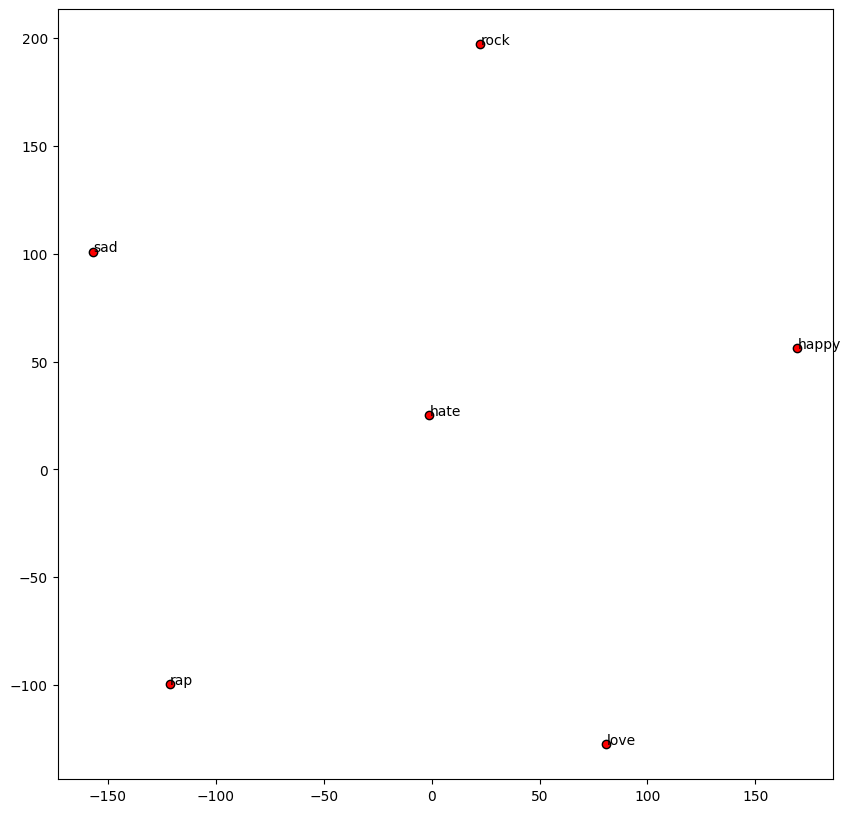

In [12]:
import numpy as np
from sklearn.manifold import TSNE

# Choose a subset of words to visualize (optional)
chosen_words = ['rap', 'rock', 'love', 'hate', 'happy', 'sad']  # Just an example
vectors = np.array([w2v_model_bigrams.wv[word] for word in chosen_words])
print(len(vectors))


# Perform t-SNE
# Perform t-SNE with perplexity less than 10
tsne = TSNE(n_components=2, random_state=42, perplexity=5)
vectors_tsne = tsne.fit_transform(vectors)

# Create a scatter plot
plt.figure(figsize=(10, 10))
plt.scatter(vectors_tsne[:, 0], vectors_tsne[:, 1], edgecolors='k', c='r')

# Add labels
for word, (x, y) in zip(chosen_words, vectors_tsne):
    plt.text(x, y, word)

plt.show()


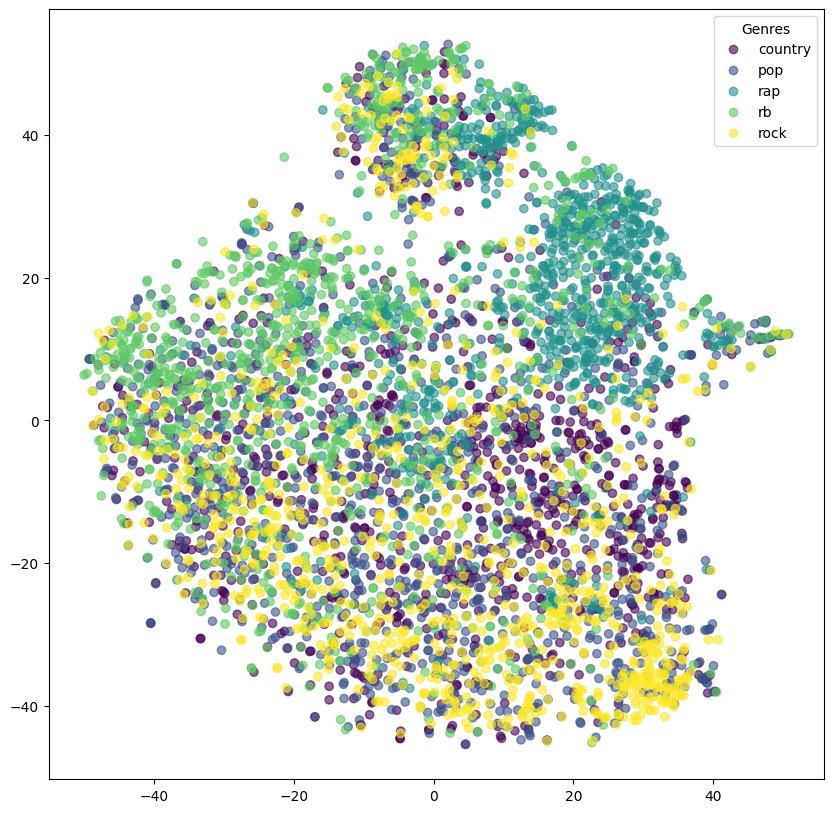

In [13]:
from sklearn.manifold import TSNE

# Sample a subset of your data
df_sample = df.groupby('tag').apply(lambda x: x.sample(n=1000, replace=True)).reset_index(drop=True)

# Create a list of vectors
vectors = np.array(df_sample['word2vec_lyrics'].tolist())

# Use t-SNE to reduce the vectors to 2 dimensions
tsne = TSNE(n_components=2, random_state=42)
vectors_2d = tsne.fit_transform(vectors)

# Create a scatter plot, using colors to represent different genres
plt.figure(figsize=(10, 10))
scatter = plt.scatter(vectors_2d[:, 0], vectors_2d[:, 1], c=df_sample['tag'].astype('category').cat.codes, alpha=0.6)

# Create a legend
handles, labels = scatter.legend_elements(prop="colors")
plt.legend(handles, df_sample['tag'].astype('category').cat.categories, title="Genres")

plt.show()


In [17]:
w2v_model_bigrams.wv.most_similar('duck')
#w2v_model_bigrams.wv.most_similar(positive=['woman', 'king'], negative=['man'])



[('better_duck', 0.7750961184501648),
 ('aflac', 0.688588559627533),
 ('quack', 0.6710900664329529),
 ('dodge', 0.6533766388893127),
 ('buck', 0.6509982347488403),
 ('duck_duck', 0.6408592462539673),
 ('swat', 0.6343700289726257),
 ('duck_goose', 0.6323557496070862),
 ('daffy', 0.6236951947212219),
 ('goose_duck', 0.6204304099082947)]

In [18]:
df.shape

(3315185, 7)

In [19]:
df = df.dropna(subset=['word2vec_lyrics'])

In [20]:
df.shape

(3314966, 7)

In [23]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from imblearn.over_sampling import RandomOverSampler

# Initialize the Random Over Sampler
ros = RandomOverSampler(random_state=42)


X = np.vstack(df['word2vec_lyrics'].values)
y = df['tag']

# Split the data into 70% train and 30% temporary test set
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

# Split the temporary test set into 50% test and 50% validation (15% of the total data each)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42)

# Fit and resample the training data
X_train_res, y_train_res = ros.fit_resample(X_train, y_train)

# Create the classifier
clf = RandomForestClassifier(n_jobs=10, verbose=3, class_weight='balanced', random_state=42)

# Fit the model on the train data
clf.fit(X_train_res, y_train_res)

# Predict on the test and validation sets
y_test_pred = clf.predict(X_test)
y_val_pred = clf.predict(X_val)

print("Test Classification Report:")
print(classification_report(y_test, y_test_pred))

print("\nValidation Classification Report:")
print(classification_report(y_val, y_val_pred))


[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.


building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100


[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:  3.5min


building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed: 19.2min finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    1.3s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    6.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    5.9s finished


Test Classification Report:
              precision    recall  f1-score   support

     country       0.46      0.09      0.15     12677
         pop       0.62      0.83      0.71    215345
         rap       0.84      0.84      0.84    149475
          rb       0.40      0.10      0.16     23801
        rock       0.54      0.27      0.36     95947

    accuracy                           0.67    497245
   macro avg       0.57      0.43      0.44    497245
weighted avg       0.65      0.67      0.64    497245


Validation Classification Report:
              precision    recall  f1-score   support

     country       0.45      0.09      0.14     12677
         pop       0.62      0.83      0.71    215345
         rap       0.84      0.84      0.84    149475
          rb       0.40      0.09      0.15     23801
        rock       0.54      0.27      0.36     95947

    accuracy                           0.67    497245
   macro avg       0.57      0.42      0.44    497245
weighted avg  

In [25]:

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

X = np.vstack(df['word2vec_lyrics'].values)
y = df['tag']

# Split the data into 70% train and 30% temporary test set
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

# Split the temporary test set into 50% test and 50% validation (15% of the total data each)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42)

# Initialize the Random Over Sampler
ros = RandomOverSampler(random_state=42)

# Fit and resample the training data
X_train_res, y_train_res = ros.fit_resample(X_train, y_train)

# Initialize the logistic regression model
log_reg = LogisticRegression(n_jobs=15, verbose=1)

# Fit the model
log_reg.fit(X_train_res, y_train_res)

# Make predictions
y_test_pred = log_reg.predict(X_test)

# Print classification report
print("Test Classification Report:")
print(classification_report(y_test, y_test_pred))


[Parallel(n_jobs=15)]: Using backend LokyBackend with 15 concurrent workers.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          505     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.08696D+06    |proj g|=  7.77726D+05


 This problem is unconstrained.


: 

: 